### Project Title:

Connectel Ltd. Customer Churn Prediction.
A 10Alytics Capstone Project by Ndibe Ifeoma Maryanne in fulfilment of the requirement for the completion of Full Stack Data Science Program.

### Introduction:

Churn can be desribed as one of the biggest problem in the telecom industry. The average monthly churn rate in the US ranges between 1.9% - 2%. It is the loss of customers or subscribers who stop doing business with a company or services.

In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

C:\Users\hp\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#read data file using pandas dataframe read_csv() method
data = pd.read_csv('Customer-Churn.csv')

In [3]:
#pandas set_option to display all columns to avoid hidden columns
pd.set_option('display.max_columns', None)

### Top 5 rows

In [4]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


### Last 5 rows

In [5]:
data.tail()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.5,No


In [6]:
data.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

### All columns in the dataset

In [7]:
# Change some column names

data.rename(columns={'customerID':'CustomerID', 'gender':'Gender','tenure':'Tenure'}, inplace=True)

In [8]:
data.head()

,CustomerID,Gender,SeniorCitizen,Partner,Dependents,Tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


### Identify the number of rows and columns

In [9]:
data.shape
print('The number of rows: ', data.shape[0])
print('The number of columns: ', data.shape[1])

The number of rows:  7043
The number of columns:  21


### Dataset

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   CustomerID        7043 non-null   object 
 1   Gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   Tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


### Unique values for each Feature/Column

In [12]:
data.nunique()

CustomerID          7043
Gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
Tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

### The description of the numerical columns of the dataset

In [13]:
data.describe()

,SeniorCitizen,Tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


### Identify missing values or null values

In [15]:
data_miss = data.isnull().values.any()
print('Are there missing values?:', data_miss)

Are there missing values?: False


In [17]:
# The total number of missing values.
data.isnull().sum()

CustomerID          0
Gender              0
SeniorCitizen       0
Partner             0
Dependents          0
Tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [20]:
# What is the percentage of this missing values against the entire dataset
data.isnull().sum() * 100 / len(data)

CustomerID          0.0
Gender              0.0
SeniorCitizen       0.0
Partner             0.0
Dependents          0.0
Tenure              0.0
PhoneService        0.0
MultipleLines       0.0
InternetService     0.0
OnlineSecurity      0.0
OnlineBackup        0.0
DeviceProtection    0.0
TechSupport         0.0
StreamingTV         0.0
StreamingMovies     0.0
Contract            0.0
PaperlessBilling    0.0
PaymentMethod       0.0
MonthlyCharges      0.0
TotalCharges        0.0
Churn               0.0
dtype: float64

<AxesSubplot:>

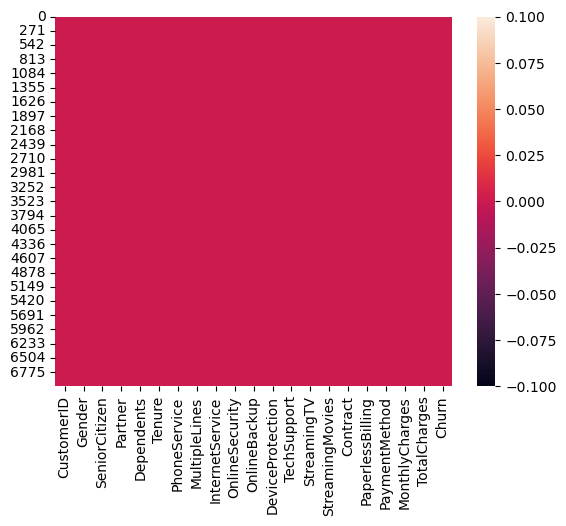

In [21]:
#Visualize the missing value using heatmap
sns.heatmap(data.isnull())

### Drop missing Values

In [24]:
data.dropna(axis=0, inplace=True) #will drop rows with contain the missing values. Default value is 0.

In [25]:
data.shape

(7043, 21)

### Identify / search for duplicate data

In [28]:
data_dup = data.duplicated().any()
print('Are there duplicate values?:', data_dup)

Are there duplicate values?: False


### Create tenure groups of 12 bins

In [29]:
# Define the bin edges (grouping tenure into bins of 12 months)
bin_edges = list(range(0, data['Tenure'].max() + 13, 12))

# Define the bin labels
bin_labels = [f"{start}-{end}" for start, end in zip(bin_edges[:-1], bin_edges[1:])]

# Create a new column "TenureGroup" with the bin labels
data['TenureGroup'] = pd.cut(data['Tenure'], bins=bin_edges, labels=bin_labels, right=False)



In [30]:
#get the maximum tenure
data['TenureGroup'].max()

'72-84'

In [32]:
# Display the top 5 rows of the updated dataset
data.head()

,CustomerID,Gender,SeniorCitizen,Partner,Dependents,Tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,TenureGroup
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0-12
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No,24-36
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,0-12
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,36-48
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,0-12


In [33]:
data['TenureGroup']

0        0-12
1       24-36
2        0-12
3       36-48
4        0-12
        ...  
7038    24-36
7039    72-84
7040     0-12
7041     0-12
7042    60-72
Name: TenureGroup, Length: 7043, dtype: category
Categories (7, object): ['0-12' < '12-24' < '24-36' < '36-48' < '48-60' < '60-72' < '72-84']

In [34]:
data['TenureGroup'].value_counts()

0-12     2069
60-72    1121
12-24    1047
24-36     876
48-60     820
36-48     748
72-84     362
Name: TenureGroup, dtype: int64

### Identify irrelevant Features/column

In [35]:
#drop CustomerID column

In [36]:
data = data.drop(['CustomerID'],axis=1)

In [37]:
data.head()

,Gender,SeniorCitizen,Partner,Dependents,Tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,TenureGroup
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0-12
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No,24-36
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,0-12
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,36-48
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,0-12


### Univariate Analysis

### Gender Distribution

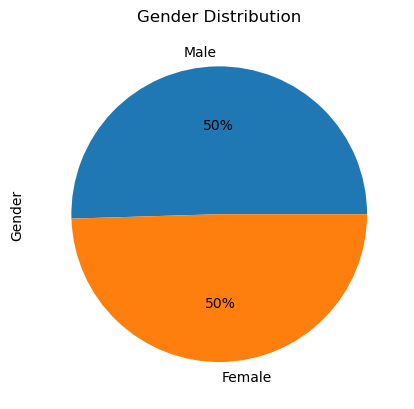

In [41]:
data['Gender'].value_counts().plot(kind='pie', autopct='%.0f%%')
plt.title("Gender Distribution")
plt.show()

#### The plot reveals equal distribution between male and female customers of Connecttel 

### Senior Citizens

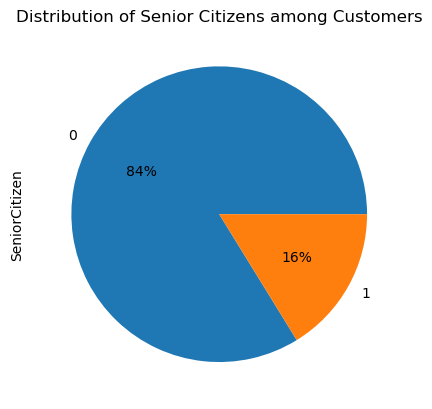

In [40]:
data['SeniorCitizen'].value_counts().plot(kind='pie', autopct='%.0f%%')
plt.title("Distribution of Senior Citizens among Customers")
plt.show()

#### The chart above reveals that Connectel has 16% of their customers are senior citizens

### Partner

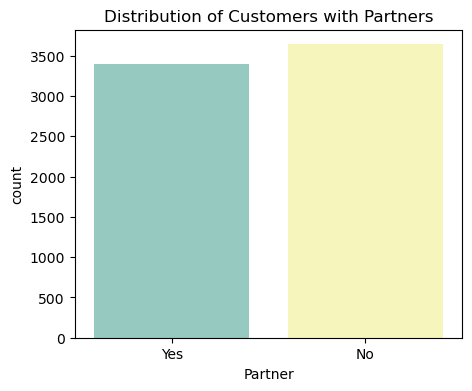

In [42]:
#create a countplot
plt.figure(figsize=(5,4))
sns.countplot(x='Partner', data=data, palette='Set3')

#customize the plot with label
plt.title("Distribution of Customers with Partners")

#show the plot
plt.show()


### Dependents

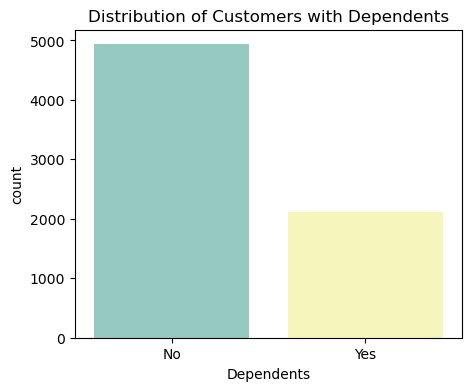

In [43]:
#create a countplot
plt.figure(figsize=(5,4))
sns.countplot(x='Dependents', data=data, palette='Set3')

#customize the plot with label
plt.title('Distribution of Customers with Dependents')

#show the plot
plt.show()

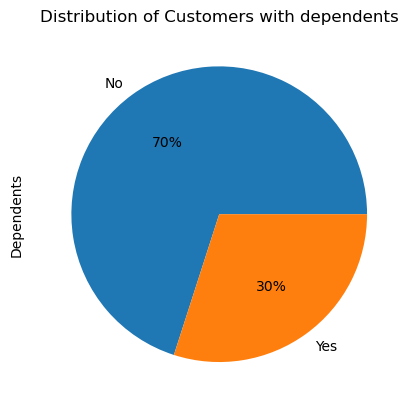

In [44]:
data['Dependents'].value_counts().plot(kind='pie', autopct='%.0f%%')
plt.title("Distribution of Customers with dependents")
plt.show()

#### From the chart above, 30% of the customers have dependents

### Phone Service

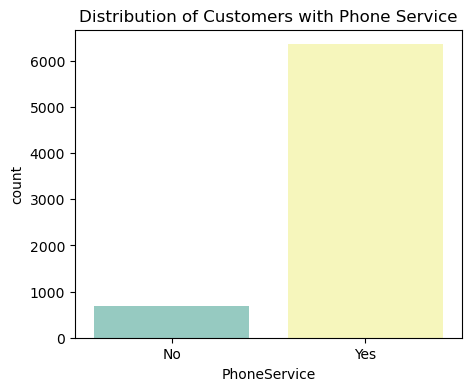

In [45]:
#create a countplot
plt.figure(figsize=(5,4))
sns.countplot(x='PhoneService', data=data, palette='Set3')

#customize the plot with label
plt.title('Distribution of Customers with Phone Service')

#show the plot
plt.show()

In [46]:
data['PhoneService'].value_counts()* 100 / len(data)

Yes    90.316626
No      9.683374
Name: PhoneService, dtype: float64

#### The plot shows that 90.3% of the customers have phone service

### Internet Service

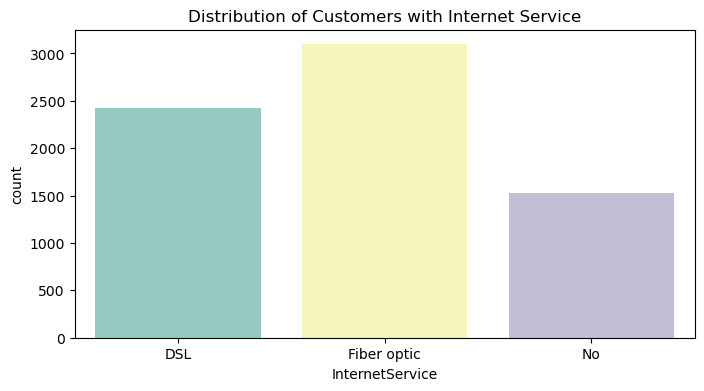

In [47]:
#create a countplot
plt.figure(figsize=(8,4))
sns.countplot(x='InternetService', data=data, palette='Set3')

#customize the plot with label
plt.title('Distribution of Customers with Internet Service')

#show the plot
plt.show()

In [48]:
data['InternetService'].value_counts()* 100 / len(data)

Fiber optic    43.958540
DSL            34.374556
No             21.666903
Name: InternetService, dtype: float64

#### The chart reveals that fiber optic Internet service has the most subscription

### OnlineSecurity

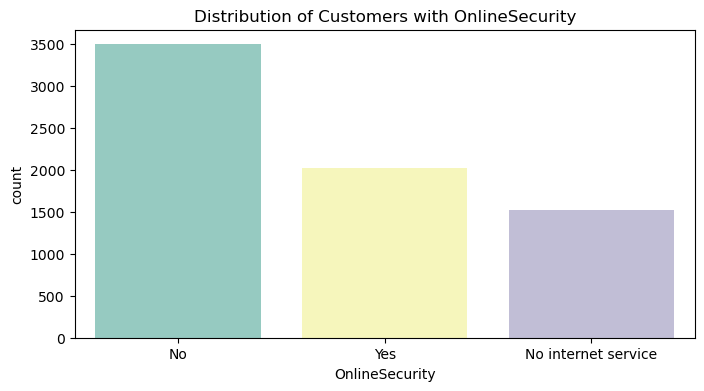

In [49]:
#create a countplot
plt.figure(figsize=(8,4))
sns.countplot(x='OnlineSecurity', data=data, palette='Set3')

#customize the plot with label
plt.title('Distribution of Customers with OnlineSecurity')

#show the plot
plt.show()

In [50]:
data['OnlineSecurity'].value_counts()* 100 / len(data)

No                     49.666335
Yes                    28.666761
No internet service    21.666903
Name: OnlineSecurity, dtype: float64

#### From the details above most of Connecttel Ltd's customers do not have Online Security service. 

### OnlineBackup 

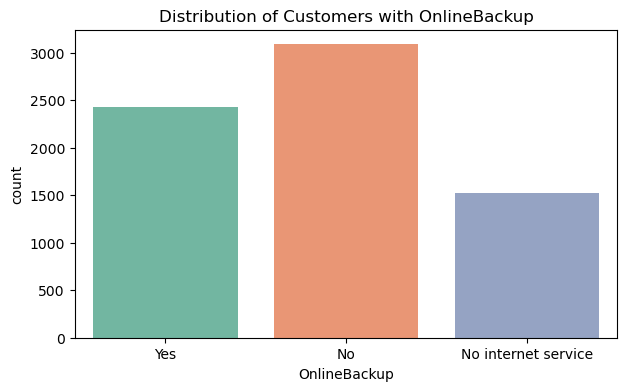

In [53]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='OnlineBackup', data=data, palette='Set2')

#customize the plot with label
plt.title('Distribution of Customers with OnlineBackup')

#show the plot
plt.show()

In [54]:
data['OnlineBackup'].value_counts()* 100 / len(data)

No                     43.844952
Yes                    34.488144
No internet service    21.666903
Name: OnlineBackup, dtype: float64

#### The above shows that most of the customers do not have Online Backup Service. 

### Device Protection

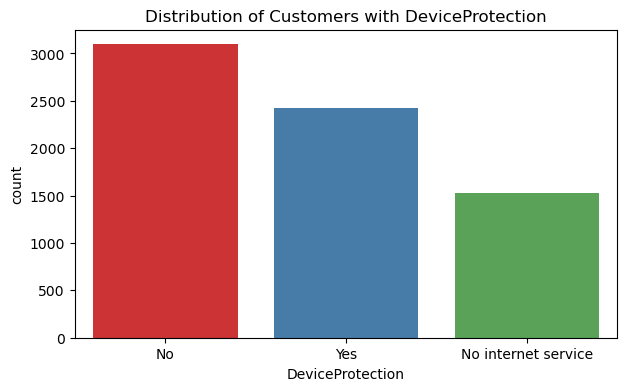

In [55]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='DeviceProtection', data=data, palette='Set1')

#customize the plot with label
plt.title('Distribution of Customers with DeviceProtection')

#show the plot
plt.show()

In [56]:
data['DeviceProtection'].value_counts()* 100 / len(data)

No                     43.944342
Yes                    34.388755
No internet service    21.666903
Name: DeviceProtection, dtype: float64

### Tech Support

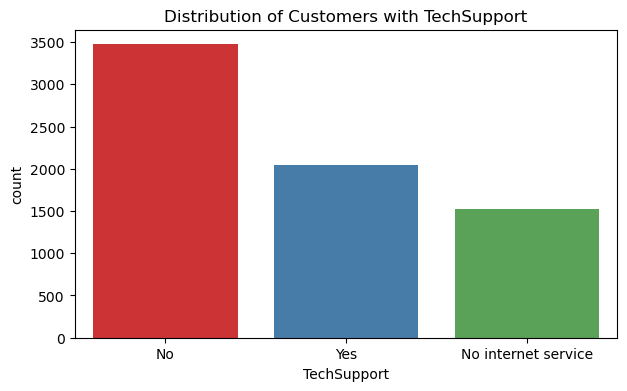

In [58]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='TechSupport', data=data, palette='Set1')

#customize the plot with label
plt.title('Distribution of Customers with TechSupport')

#show the plot
plt.show()

In [59]:
data['TechSupport'].value_counts()* 100 / len(data)

No                     49.311373
Yes                    29.021724
No internet service    21.666903
Name: TechSupport, dtype: float64

#####  From the above plot, 49% of Connectel customers do not get tech support. 

### StreamingTV

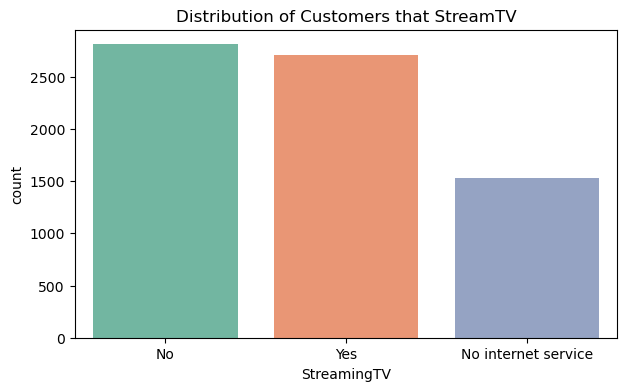

In [60]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='StreamingTV', data=data, palette='Set2')

#customize the plot with label
plt.title('Distribution of Customers that StreamTV')

#show the plot
plt.show()

In [61]:
data['StreamingTV'].value_counts()* 100 / len(data)

No                     39.897771
Yes                    38.435326
No internet service    21.666903
Name: StreamingTV, dtype: float64

### Streaming Movies

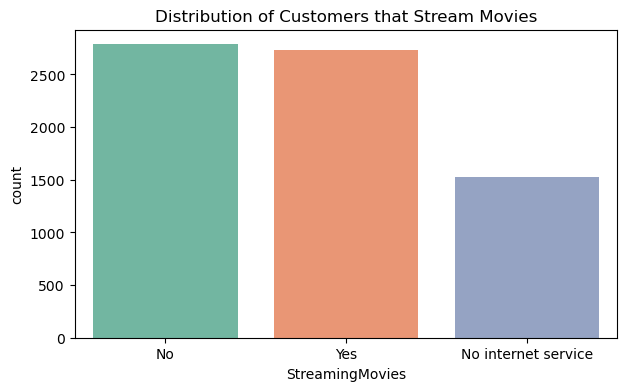

In [64]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='StreamingMovies', data=data, palette='Set2')

#customize the plot with label
plt.title('Distribution of Customers that Stream Movies')

#show the plot
plt.show()

In [65]:
data['StreamingMovies'].value_counts()* 100 / len(data)

No                     39.542808
Yes                    38.790288
No internet service    21.666903
Name: StreamingMovies, dtype: float64

### Contract

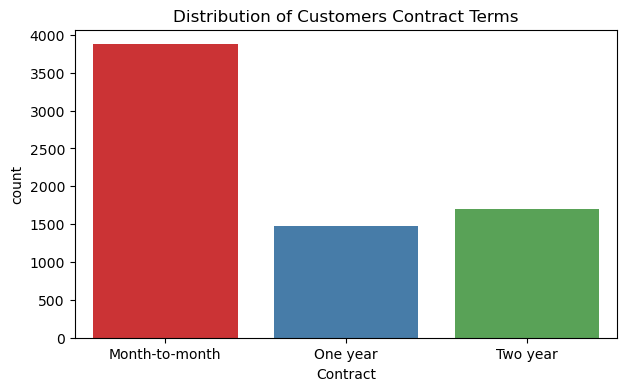

In [67]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='Contract', data=data, palette='Set1')

#customize the plot with label
plt.title('Distribution of Customers Contract Terms')

#show the plot
plt.show()

In [68]:
data['Contract'].value_counts()* 100 / len(data)

Month-to-month    55.019168
Two year          24.066449
One year          20.914383
Name: Contract, dtype: float64

#### The dataset revelas that more customers are in the Month to Month category of Contract. Therefore they are prone to churn.

### Paperless Billing

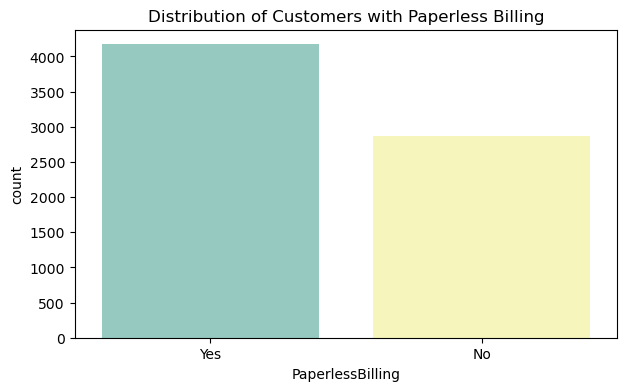

In [70]:
#create a countplot
plt.figure(figsize=(7,4))
sns.countplot(x='PaperlessBilling', data=data, palette='Set3')

#customize the plot with label
plt.title('Distribution of Customers with Paperless Billing')

#show the plot
plt.show()

In [71]:
data['PaperlessBilling'].value_counts()* 100 / len(data)

Yes    59.221922
No     40.778078
Name: PaperlessBilling, dtype: float64

### Payment Method

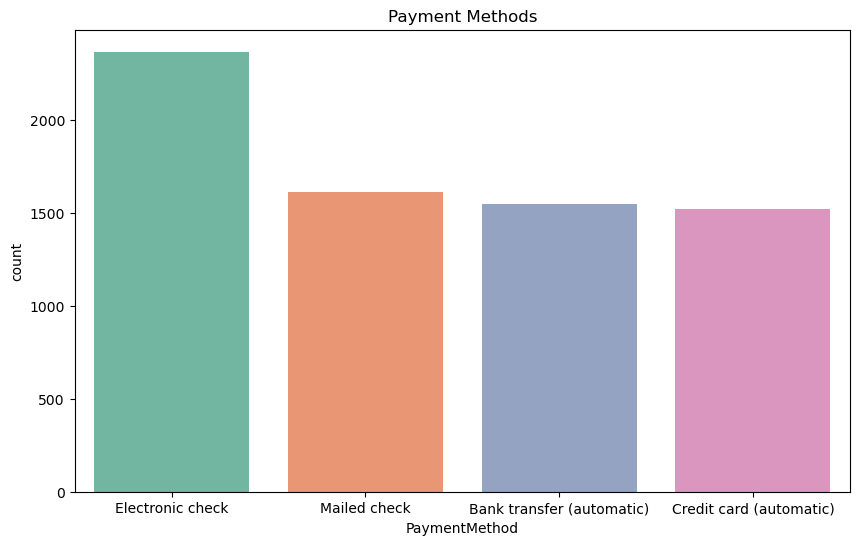

In [72]:
#create a countplot
plt.figure(figsize=(10,6))
sns.countplot(x='PaymentMethod', data=data, palette='Set2')

#customize the plot with label
plt.title('Payment Methods')

#show the plot
plt.show()

### Churn

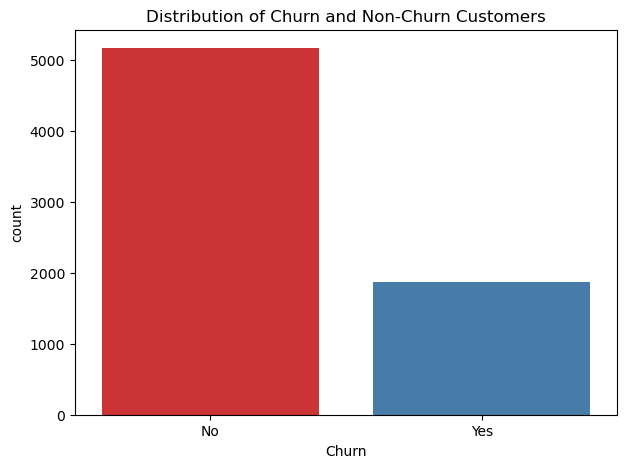

In [73]:
#create a countplot
plt.figure(figsize=(7,5))
sns.countplot(x='Churn', data=data, palette='Set1')

#customize the plot with label
plt.title('Distribution of Churn and Non-Churn Customers')

#show the plot
plt.show()

In [56]:
data['Churn'].value_counts()* 100 / len(data)

No     73.421502
Yes    26.578498
Name: Churn, dtype: float64

In [57]:
data['Churn'].value_counts()

No     5163
Yes    1869
Name: Churn, dtype: int64

##### The Chart revelas that 26.6% of the customers had reasons to cancel their subscription to Connectel services while 73.4% did not cancel service.

### BIVARIATE ANALYSIS

### Gender and Churn distribution

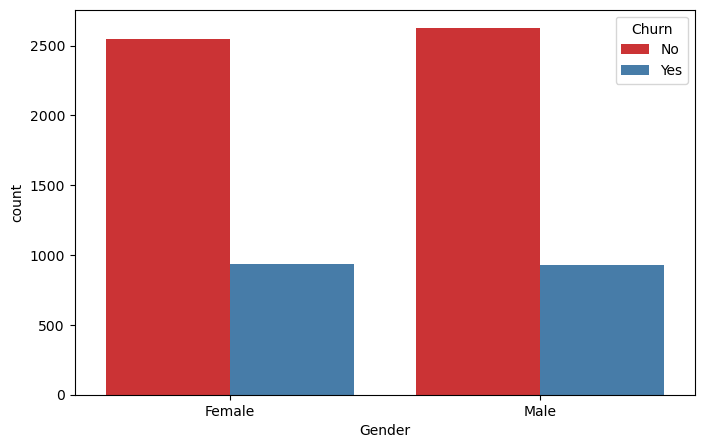

In [74]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', data=data, hue='Churn', palette='Set1')
plt.xlabel = 'Gender'
plt.ylabel = 'Count'

### Senior Citizens and Churn

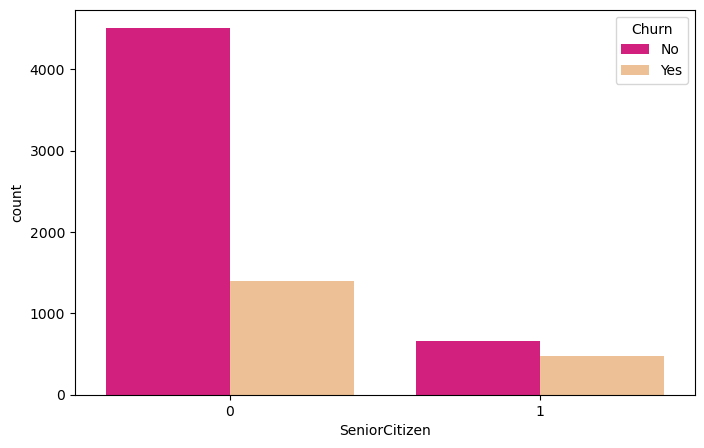

In [76]:
plt.figure(figsize=(8,5))
sns.countplot(x='SeniorCitizen', data=data, hue='Churn', palette='Accent_r')
plt.xlabel = 'Senior Citizen'
plt.ylabel = 'Count'

#### From the above, the ratio of senior citizen that churn is high. Senior citizen are likely to churn

### Dependents and Churn

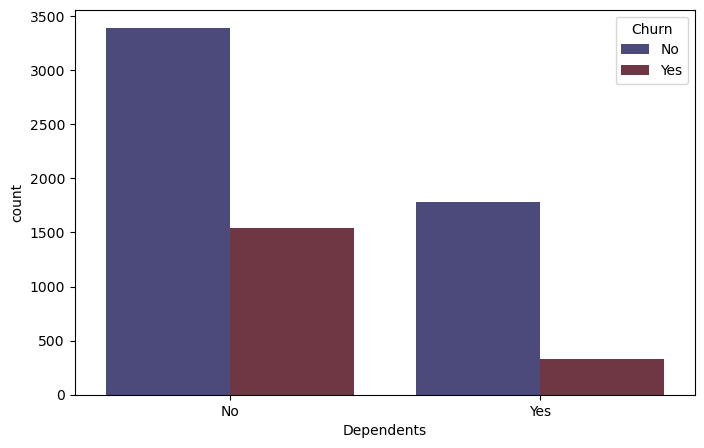

In [79]:
plt.figure(figsize=(8,5))
sns.countplot(x='Dependents', data=data, hue='Churn', palette='icefire')
plt.xlabel = 'Dependents'
plt.ylabel = 'Count'

#### The above shows that customers without dependencies have high rate of churning while those with dependents have low rate of churning

### Churn and Partner

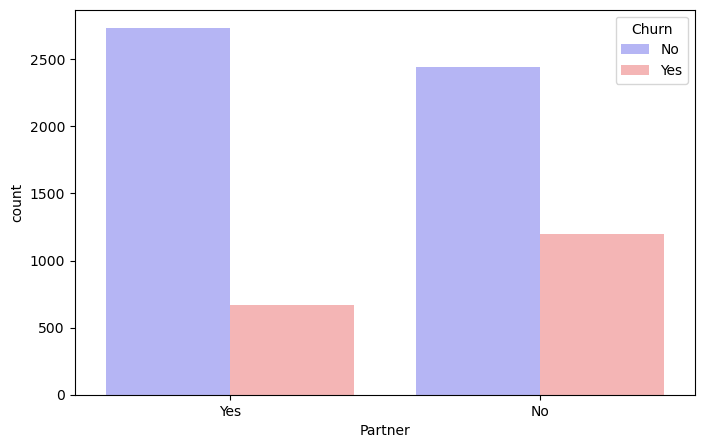

In [81]:
plt.figure(figsize=(8,5))
sns.countplot(x='Partner', data=data, hue='Churn', palette='bwr')
plt.xlabel = 'Partner'
plt.ylabel = 'Count'

#### The chart reveals that those without partners have high tendencies to churn

### PhoneService and Churn

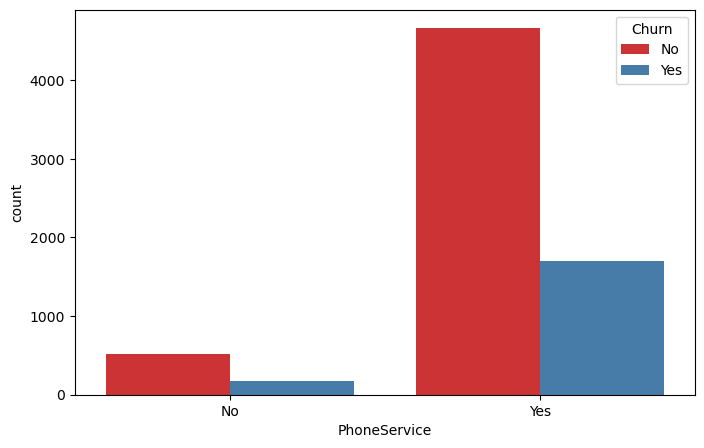

In [82]:
plt.figure(figsize=(8,5))
sns.countplot(x='PhoneService', data=data, hue='Churn', palette='Set1')
plt.xlabel = 'Phone Service'
plt.ylabel = 'Count'

#### It shows clearly that those with phone service have high rate of churning

### Churn and Multiplelines

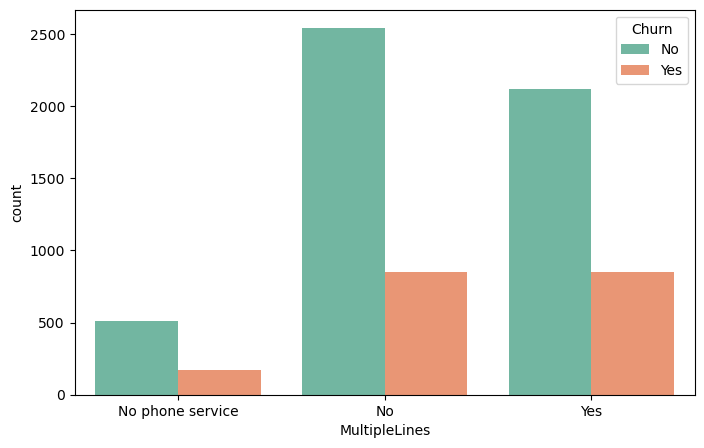

In [83]:
plt.figure(figsize=(8,5))
sns.countplot(x='MultipleLines', data=data, hue='Churn', palette='Set2')
plt.xlabel = 'Multiple Lines'
plt.ylabel = 'Count'

### Churn and Internet Service

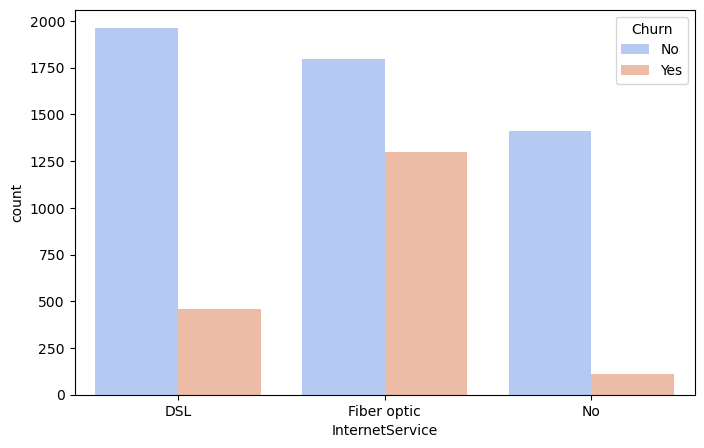

In [85]:
plt.figure(figsize=(8,5))
sns.countplot(x='InternetService', data=data, hue='Churn', palette='coolwarm')
plt.xlabel = 'Internet Service'
plt.ylabel = 'Count'

#### From the above, we can say that customers with fibre optic internet service have high rate of churning.

### Churn and OnlineSecurity

In [86]:
data.columns

Index(['Gender', 'SeniorCitizen', 'Partner', 'Dependents', 'Tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn', 'TenureGroup'],
      dtype='object')

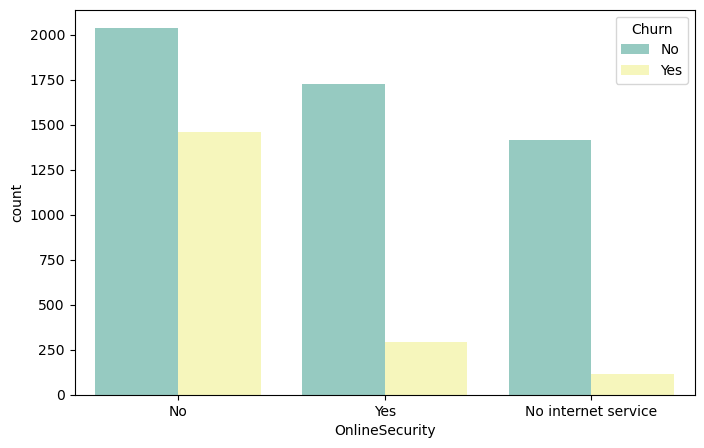

In [87]:
plt.figure(figsize=(8,5))
sns.countplot(x='OnlineSecurity', data=data, hue='Churn', palette='Set3')
plt.xlabel = 'Online Security'
plt.ylabel = 'Count'

#### Those without online security have high rates of churning.

### Tenure Group and Churn

In [88]:
data.columns

Index(['Gender', 'SeniorCitizen', 'Partner', 'Dependents', 'Tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn', 'TenureGroup'],
      dtype='object')

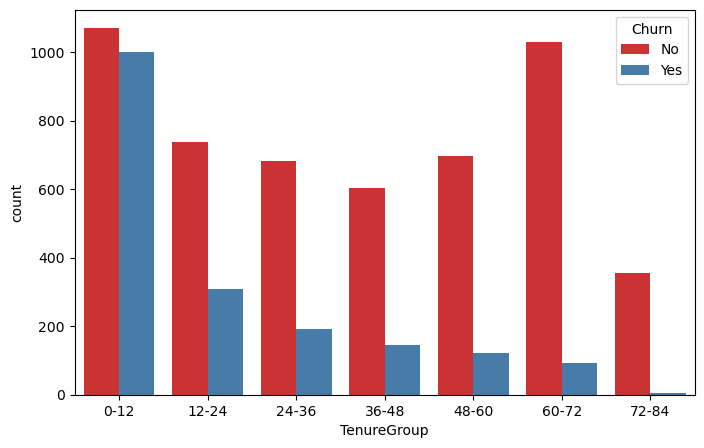

In [89]:
plt.figure(figsize=(8,5))
sns.countplot(x='TenureGroup', data=data, hue='Churn', palette='Set1')
plt.xlabel = 'Tenure Group'
plt.ylabel = 'Count'

#### From the above plot, customers within their first 12months have high rate of churning followed by those within 12 - 24 months.

### Contract and Churn

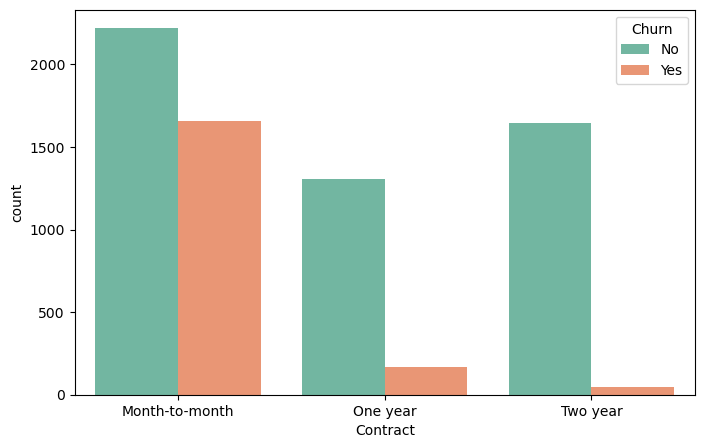

In [90]:
plt.figure(figsize=(8,5))
sns.countplot(x='Contract', data=data, hue='Churn', palette='Set2')
plt.xlabel = 'Contract'
plt.ylabel = 'Count'

#### A short term contract is not favourable to the Connecttel Ltd the chart reveals that majority of those with Month-to-Month subscription are churning.

### Churn and Payment Method

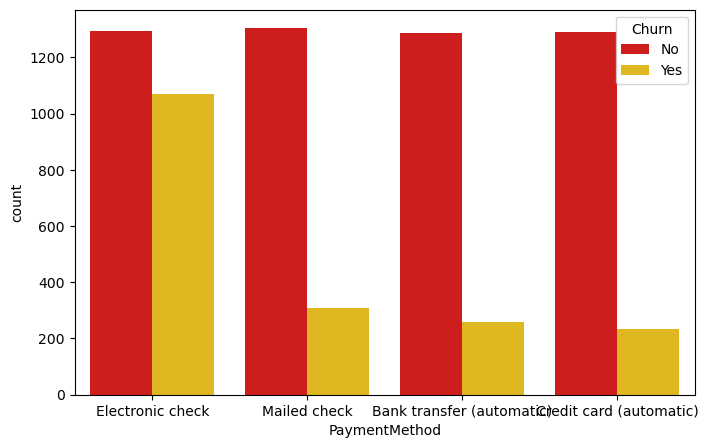

In [92]:
plt.figure(figsize=(8,5))
sns.countplot(x='PaymentMethod', data=data, hue='Churn', palette='hot')
plt.xlabel = 'Payment Method'
plt.ylabel = 'Count'

#### Those with Electronic check are highest churners

### Churn by Monthlycharges

TypeError: 'str' object is not callable

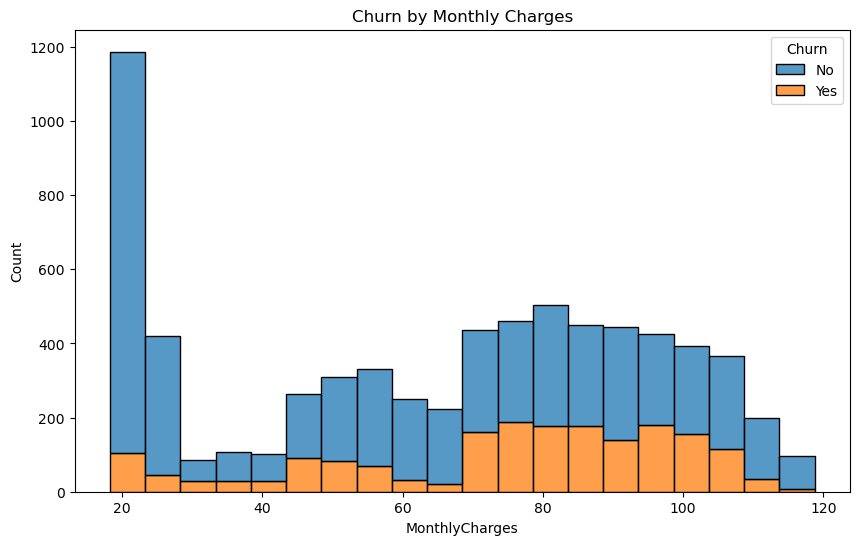

In [95]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x="MonthlyCharges", hue="Churn", multiple="stack", bins=20)
plt.title('Churn by Monthly Charges')
plt.xlabel('Monthly Charges')
plt.ylabel('Count')
plt.legend(title='Churn', labels=['Not Churned', 'Churned'])
plt.show()

#### The plot shows that the higher the monthly charges the higher the churn.

### TechSupport and Churn rate

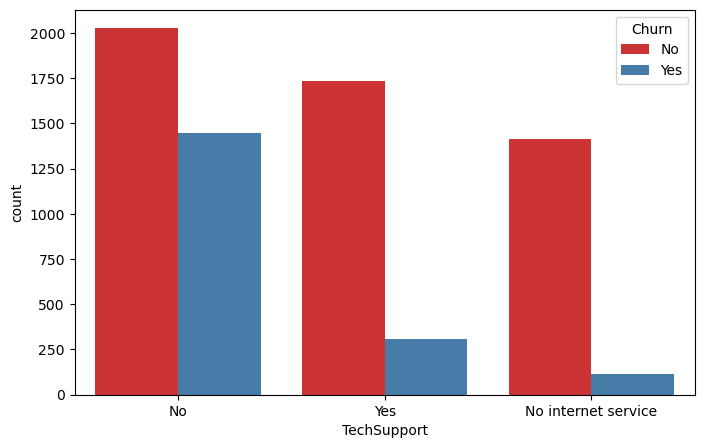

In [96]:
plt.figure(figsize=(8,5))
sns.countplot(x='TechSupport', data=data, hue='Churn', palette='Set1')
plt.xlabel = 'Technical Support Distribution'
plt.ylabel = 'Count'

The above plot, reveals that customers are not given adequate technical support. About 70% of the customers do not receive technical support. This can lead to high churn rate as seen.

### Correlation

<AxesSubplot:>

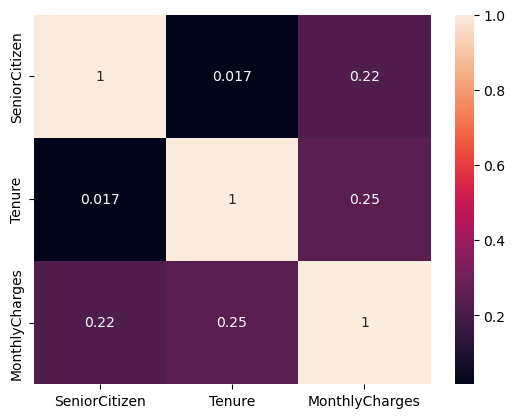

In [97]:
sns.heatmap(data.corr(), annot=True)

This shows that the is a weak correlation among the variables. 

### DATA PREPROCESSING

#### Convert Target variable, CHURN into binary of 0 or 1

In [98]:
#import the LabelEncoder 
from sklearn.preprocessing import LabelEncoder

In [99]:
#create an instance of labelencoder()
label_en = LabelEncoder()

#convert churn column into numerical values
data['Churn'] = label_en.fit_transform(data['Churn'])

In [100]:
data.head()

,Gender,SeniorCitizen,Partner,Dependents,Tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,TenureGroup
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0,0-12
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,0,24-36
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,0-12
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0,36-48
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,0-12


In [101]:
data['Churn']

0       0
1       0
2       1
3       0
4       1
       ..
7038    0
7039    0
7040    0
7041    1
7042    0
Name: Churn, Length: 7043, dtype: int32

In [102]:
#Identify all categorical variables automatically

In [103]:
categorical_columns = []
numerical_columns = []

for column in data.columns:
    if data[column].dtype == 'object':
        categorical_columns.append(column)
    else:
        numerical_columns.append(column)

In [104]:
categorical_columns

['Gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'TotalCharges']

In [105]:
#convert all categorical variables to numerical variables

In [106]:
data = pd.get_dummies(data, drop_first=True)

In [107]:
data

,SeniorCitizen,Tenure,MonthlyCharges,Churn,Gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,TotalCharges_100.2,TotalCharges_100.25,TotalCharges_100.35,TotalCharges_100.4,TotalCharges_100.8,TotalCharges_100.9,TotalCharges_1001.2,TotalCharges_1001.5,TotalCharges_1003.05,TotalCharges_1004.35,TotalCharges_1004.5,TotalCharges_1004.75,TotalCharges_1005.7,TotalCharges_1006.9,TotalCharges_1007.8,TotalCharges_1007.9,TotalCharges_1008.55,TotalCharges_1008.7,TotalCharges_1009.25,TotalCharges_101.1,TotalCharges_101.45,TotalCharges_101.65,TotalCharges_101.9,TotalCharges_1010,TotalCharges_1011.05,TotalCharges_1011.5,TotalCharges_1011.8,TotalCharges_1012.4,TotalCharges_1013.05,TotalCharges_1013.2,TotalCharges_1013.35,TotalCharges_1013.6,TotalCharges_1014.25,TotalCharges_1016.7,TotalCharges_1017.35,TotalCharges_102.45,TotalCharges_102.5,TotalCharges_102.75,TotalCharges_1020.2,TotalCharges_1020.75,TotalCharges_1021.55,TotalCharges_1021.75,TotalCharges_1021.8,TotalCharges_1022.5,TotalCharges_1022.6,TotalCharges_1022.95,TotalCharges_1023.75,TotalCharges_1023.85,TotalCharges_1023.9,TotalCharges_1023.95,TotalCharges_1024,TotalCharges_1024.65,TotalCharges_1024.7,TotalCharges_1025.05,TotalCharges_1025.15,TotalCharges_1025.95,TotalCharges_1026.35,TotalCharges_1027.25,TotalCharges_1028.75,TotalCharges_1028.9,TotalCharges_1029.35,TotalCharges_1029.75,TotalCharges_1029.8,TotalCharges_103.7,TotalCharges_1031.1,TotalCharges_1031.4,TotalCharges_1031.7,TotalCharges_1032,TotalCharges_1032.05,TotalCharges_1033,TotalCharges_1033.9,TotalCharges_1033.95,TotalCharges_1035.5,TotalCharges_1035.7,TotalCharges_1036,TotalCharges_1036.75,TotalCharges_1037.75,TotalCharges_1039.45,TotalCharges_104.2,TotalCharges_104.3,TotalCharges_1041.8,TotalCharges_1042.65,TotalCharges_1043.3,TotalCharges_1043.35,TotalCharges_1043.4,TotalCharges_1043.8,TotalCharges_1045.25,TotalCharges_1046.1,TotalCharges_1046.2,TotalCharges_1046.5,TotalCharges_1047.7,TotalCharges_1048.45,TotalCharges_1048.85,TotalCharges_1049.05,TotalCharges_1049.6,TotalCharges_105.5,TotalCharges_105.6,TotalCharges_1050.5,TotalCharges_1051.05,TotalCharges_1051.9,TotalCharges_1052.35,TotalCharges_1052.4,TotalCharges_1054.6,TotalCharges_1054.75,TotalCharges_1054.8,TotalCharges_1055.9,TotalCharges_1056.95,TotalCharges_1057,TotalCharges_1057.55,TotalCharges_1057.85,TotalCharges_1058.1,TotalCharges_1058.25,TotalCharges_1058.6,TotalCharges_1059.55,TotalCharges_106.2,TotalCharges_106.55,TotalCharges_106.8,TotalCharges_106.85,TotalCharges_106.9,TotalCharges_1060.2,TotalCharges_1060.6,TotalCharges_1061.6,TotalCharges_1062.1,TotalCharges_1064.65,TotalCharges_1064.95,TotalCharges_1066.15,TotalCharges_1066.9,TotalCharges_1067.05,TotalCharges_1067.15,TotalCharges_1067.65,TotalCharges_1068.15,TotalCharges_1068.85,TotalCharges_107.05,TotalCharges_107.1,TotalCharges_107.25,TotalCharges_107.6,TotalCharges_1070.15,TotalCharges_1070.25,TotalCharges_1070.5,TotalCharges_1070.7,TotalCharges_1071.4,TotalCharges_1071.6,TotalCharges_1072,TotalCharges_1072.6,TotalCharges_1073.3,TotalCharges_1074.3,TotalCharges_1074.65,TotalCharges_1077.05,TotalCharges_1077.5,TotalCharges_1077.95,TotalCharges_1078.75,TotalCharges_1078.9,TotalCharges_1079.05,TotalCharges_1079.45,TotalCharges_1079.65,TotalCharges_108.05,TotalCharges_108.15,TotalCharges_108.65,TotalCharges_108.7,TotalCharges_108.95,TotalCharges_1080.55,TotalCharges_1081.25,TotalCharges_1081.45,TotalCharges_1082.75,TotalCharges_1082.8,Tota

### Feature Scaling

In [123]:
#create an array of the numerical columns
nCols = ['TotalCharges', 'MonthlyCharges', 'Tenure']

In [124]:
#import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

In [125]:
#create an instance of MinMaxScaler
mms = MinMaxScaler()

In [126]:
data[nCols] = mms.fit_transform(data[nCols])

KeyError: "['TotalCharges'] not in index"

In [127]:
data

,SeniorCitizen,Tenure,MonthlyCharges,Churn,Gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,TotalCharges_100.2,TotalCharges_100.25,TotalCharges_100.35,TotalCharges_100.4,TotalCharges_100.8,TotalCharges_100.9,TotalCharges_1001.2,TotalCharges_1001.5,TotalCharges_1003.05,TotalCharges_1004.35,TotalCharges_1004.5,TotalCharges_1004.75,TotalCharges_1005.7,TotalCharges_1006.9,TotalCharges_1007.8,TotalCharges_1007.9,TotalCharges_1008.55,TotalCharges_1008.7,TotalCharges_1009.25,TotalCharges_101.1,TotalCharges_101.45,TotalCharges_101.65,TotalCharges_101.9,TotalCharges_1010,TotalCharges_1011.05,TotalCharges_1011.5,TotalCharges_1011.8,TotalCharges_1012.4,TotalCharges_1013.05,TotalCharges_1013.2,TotalCharges_1013.35,TotalCharges_1013.6,TotalCharges_1014.25,TotalCharges_1016.7,TotalCharges_1017.35,TotalCharges_102.45,TotalCharges_102.5,TotalCharges_102.75,TotalCharges_1020.2,TotalCharges_1020.75,TotalCharges_1021.55,TotalCharges_1021.75,TotalCharges_1021.8,TotalCharges_1022.5,TotalCharges_1022.6,TotalCharges_1022.95,TotalCharges_1023.75,TotalCharges_1023.85,TotalCharges_1023.9,TotalCharges_1023.95,TotalCharges_1024,TotalCharges_1024.65,TotalCharges_1024.7,TotalCharges_1025.05,TotalCharges_1025.15,TotalCharges_1025.95,TotalCharges_1026.35,TotalCharges_1027.25,TotalCharges_1028.75,TotalCharges_1028.9,TotalCharges_1029.35,TotalCharges_1029.75,TotalCharges_1029.8,TotalCharges_103.7,TotalCharges_1031.1,TotalCharges_1031.4,TotalCharges_1031.7,TotalCharges_1032,TotalCharges_1032.05,TotalCharges_1033,TotalCharges_1033.9,TotalCharges_1033.95,TotalCharges_1035.5,TotalCharges_1035.7,TotalCharges_1036,TotalCharges_1036.75,TotalCharges_1037.75,TotalCharges_1039.45,TotalCharges_104.2,TotalCharges_104.3,TotalCharges_1041.8,TotalCharges_1042.65,TotalCharges_1043.3,TotalCharges_1043.35,TotalCharges_1043.4,TotalCharges_1043.8,TotalCharges_1045.25,TotalCharges_1046.1,TotalCharges_1046.2,TotalCharges_1046.5,TotalCharges_1047.7,TotalCharges_1048.45,TotalCharges_1048.85,TotalCharges_1049.05,TotalCharges_1049.6,TotalCharges_105.5,TotalCharges_105.6,TotalCharges_1050.5,TotalCharges_1051.05,TotalCharges_1051.9,TotalCharges_1052.35,TotalCharges_1052.4,TotalCharges_1054.6,TotalCharges_1054.75,TotalCharges_1054.8,TotalCharges_1055.9,TotalCharges_1056.95,TotalCharges_1057,TotalCharges_1057.55,TotalCharges_1057.85,TotalCharges_1058.1,TotalCharges_1058.25,TotalCharges_1058.6,TotalCharges_1059.55,TotalCharges_106.2,TotalCharges_106.55,TotalCharges_106.8,TotalCharges_106.85,TotalCharges_106.9,TotalCharges_1060.2,TotalCharges_1060.6,TotalCharges_1061.6,TotalCharges_1062.1,TotalCharges_1064.65,TotalCharges_1064.95,TotalCharges_1066.15,TotalCharges_1066.9,TotalCharges_1067.05,TotalCharges_1067.15,TotalCharges_1067.65,TotalCharges_1068.15,TotalCharges_1068.85,TotalCharges_107.05,TotalCharges_107.1,TotalCharges_107.25,TotalCharges_107.6,TotalCharges_1070.15,TotalCharges_1070.25,TotalCharges_1070.5,TotalCharges_1070.7,TotalCharges_1071.4,TotalCharges_1071.6,TotalCharges_1072,TotalCharges_1072.6,TotalCharges_1073.3,TotalCharges_1074.3,TotalCharges_1074.65,TotalCharges_1077.05,TotalCharges_1077.5,TotalCharges_1077.95,TotalCharges_1078.75,TotalCharges_1078.9,TotalCharges_1079.05,TotalCharges_1079.45,TotalCharges_1079.65,TotalCharges_108.05,TotalCharges_108.15,TotalCharges_108.65,TotalCharges_108.7,TotalCharges_108.95,TotalCharges_1080.55,TotalCharges_1081.25,TotalCharges_1081.45,TotalCharges_1082.75,TotalCharges_1082.8,Tota

### Data Separation

In [128]:
x = data.drop('Churn', axis=1)

In [129]:
y = data['Churn']

In [131]:
x

,SeniorCitizen,Tenure,MonthlyCharges,Gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,TotalCharges_100.2,TotalCharges_100.25,TotalCharges_100.35,TotalCharges_100.4,TotalCharges_100.8,TotalCharges_100.9,TotalCharges_1001.2,TotalCharges_1001.5,TotalCharges_1003.05,TotalCharges_1004.35,TotalCharges_1004.5,TotalCharges_1004.75,TotalCharges_1005.7,TotalCharges_1006.9,TotalCharges_1007.8,TotalCharges_1007.9,TotalCharges_1008.55,TotalCharges_1008.7,TotalCharges_1009.25,TotalCharges_101.1,TotalCharges_101.45,TotalCharges_101.65,TotalCharges_101.9,TotalCharges_1010,TotalCharges_1011.05,TotalCharges_1011.5,TotalCharges_1011.8,TotalCharges_1012.4,TotalCharges_1013.05,TotalCharges_1013.2,TotalCharges_1013.35,TotalCharges_1013.6,TotalCharges_1014.25,TotalCharges_1016.7,TotalCharges_1017.35,TotalCharges_102.45,TotalCharges_102.5,TotalCharges_102.75,TotalCharges_1020.2,TotalCharges_1020.75,TotalCharges_1021.55,TotalCharges_1021.75,TotalCharges_1021.8,TotalCharges_1022.5,TotalCharges_1022.6,TotalCharges_1022.95,TotalCharges_1023.75,TotalCharges_1023.85,TotalCharges_1023.9,TotalCharges_1023.95,TotalCharges_1024,TotalCharges_1024.65,TotalCharges_1024.7,TotalCharges_1025.05,TotalCharges_1025.15,TotalCharges_1025.95,TotalCharges_1026.35,TotalCharges_1027.25,TotalCharges_1028.75,TotalCharges_1028.9,TotalCharges_1029.35,TotalCharges_1029.75,TotalCharges_1029.8,TotalCharges_103.7,TotalCharges_1031.1,TotalCharges_1031.4,TotalCharges_1031.7,TotalCharges_1032,TotalCharges_1032.05,TotalCharges_1033,TotalCharges_1033.9,TotalCharges_1033.95,TotalCharges_1035.5,TotalCharges_1035.7,TotalCharges_1036,TotalCharges_1036.75,TotalCharges_1037.75,TotalCharges_1039.45,TotalCharges_104.2,TotalCharges_104.3,TotalCharges_1041.8,TotalCharges_1042.65,TotalCharges_1043.3,TotalCharges_1043.35,TotalCharges_1043.4,TotalCharges_1043.8,TotalCharges_1045.25,TotalCharges_1046.1,TotalCharges_1046.2,TotalCharges_1046.5,TotalCharges_1047.7,TotalCharges_1048.45,TotalCharges_1048.85,TotalCharges_1049.05,TotalCharges_1049.6,TotalCharges_105.5,TotalCharges_105.6,TotalCharges_1050.5,TotalCharges_1051.05,TotalCharges_1051.9,TotalCharges_1052.35,TotalCharges_1052.4,TotalCharges_1054.6,TotalCharges_1054.75,TotalCharges_1054.8,TotalCharges_1055.9,TotalCharges_1056.95,TotalCharges_1057,TotalCharges_1057.55,TotalCharges_1057.85,TotalCharges_1058.1,TotalCharges_1058.25,TotalCharges_1058.6,TotalCharges_1059.55,TotalCharges_106.2,TotalCharges_106.55,TotalCharges_106.8,TotalCharges_106.85,TotalCharges_106.9,TotalCharges_1060.2,TotalCharges_1060.6,TotalCharges_1061.6,TotalCharges_1062.1,TotalCharges_1064.65,TotalCharges_1064.95,TotalCharges_1066.15,TotalCharges_1066.9,TotalCharges_1067.05,TotalCharges_1067.15,TotalCharges_1067.65,TotalCharges_1068.15,TotalCharges_1068.85,TotalCharges_107.05,TotalCharges_107.1,TotalCharges_107.25,TotalCharges_107.6,TotalCharges_1070.15,TotalCharges_1070.25,TotalCharges_1070.5,TotalCharges_1070.7,TotalCharges_1071.4,TotalCharges_1071.6,TotalCharges_1072,TotalCharges_1072.6,TotalCharges_1073.3,TotalCharges_1074.3,TotalCharges_1074.65,TotalCharges_1077.05,TotalCharges_1077.5,TotalCharges_1077.95,TotalCharges_1078.75,TotalCharges_1078.9,TotalCharges_1079.05,TotalCharges_1079.45,TotalCharges_1079.65,TotalCharges_108.05,TotalCharges_108.15,TotalCharges_108.65,TotalCharges_108.7,TotalCharges_108.95,TotalCharges_1080.55,TotalCharges_1081.25,TotalCharges_1081.45,TotalCharges_1082.75,TotalCharges_1082.8,TotalCharg

In [132]:
y

0       0
1       0
2       1
3       0
4       1
       ..
7038    0
7039    0
7040    0
7041    1
7042    0
Name: Churn, Length: 7043, dtype: int32

### Splitting Dataset into Testing and Training sets

In [133]:
from sklearn.model_selection import train_test_split

In [134]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [135]:
#check 

In [136]:
x_train

,SeniorCitizen,Tenure,MonthlyCharges,Gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,TotalCharges_100.2,TotalCharges_100.25,TotalCharges_100.35,TotalCharges_100.4,TotalCharges_100.8,TotalCharges_100.9,TotalCharges_1001.2,TotalCharges_1001.5,TotalCharges_1003.05,TotalCharges_1004.35,TotalCharges_1004.5,TotalCharges_1004.75,TotalCharges_1005.7,TotalCharges_1006.9,TotalCharges_1007.8,TotalCharges_1007.9,TotalCharges_1008.55,TotalCharges_1008.7,TotalCharges_1009.25,TotalCharges_101.1,TotalCharges_101.45,TotalCharges_101.65,TotalCharges_101.9,TotalCharges_1010,TotalCharges_1011.05,TotalCharges_1011.5,TotalCharges_1011.8,TotalCharges_1012.4,TotalCharges_1013.05,TotalCharges_1013.2,TotalCharges_1013.35,TotalCharges_1013.6,TotalCharges_1014.25,TotalCharges_1016.7,TotalCharges_1017.35,TotalCharges_102.45,TotalCharges_102.5,TotalCharges_102.75,TotalCharges_1020.2,TotalCharges_1020.75,TotalCharges_1021.55,TotalCharges_1021.75,TotalCharges_1021.8,TotalCharges_1022.5,TotalCharges_1022.6,TotalCharges_1022.95,TotalCharges_1023.75,TotalCharges_1023.85,TotalCharges_1023.9,TotalCharges_1023.95,TotalCharges_1024,TotalCharges_1024.65,TotalCharges_1024.7,TotalCharges_1025.05,TotalCharges_1025.15,TotalCharges_1025.95,TotalCharges_1026.35,TotalCharges_1027.25,TotalCharges_1028.75,TotalCharges_1028.9,TotalCharges_1029.35,TotalCharges_1029.75,TotalCharges_1029.8,TotalCharges_103.7,TotalCharges_1031.1,TotalCharges_1031.4,TotalCharges_1031.7,TotalCharges_1032,TotalCharges_1032.05,TotalCharges_1033,TotalCharges_1033.9,TotalCharges_1033.95,TotalCharges_1035.5,TotalCharges_1035.7,TotalCharges_1036,TotalCharges_1036.75,TotalCharges_1037.75,TotalCharges_1039.45,TotalCharges_104.2,TotalCharges_104.3,TotalCharges_1041.8,TotalCharges_1042.65,TotalCharges_1043.3,TotalCharges_1043.35,TotalCharges_1043.4,TotalCharges_1043.8,TotalCharges_1045.25,TotalCharges_1046.1,TotalCharges_1046.2,TotalCharges_1046.5,TotalCharges_1047.7,TotalCharges_1048.45,TotalCharges_1048.85,TotalCharges_1049.05,TotalCharges_1049.6,TotalCharges_105.5,TotalCharges_105.6,TotalCharges_1050.5,TotalCharges_1051.05,TotalCharges_1051.9,TotalCharges_1052.35,TotalCharges_1052.4,TotalCharges_1054.6,TotalCharges_1054.75,TotalCharges_1054.8,TotalCharges_1055.9,TotalCharges_1056.95,TotalCharges_1057,TotalCharges_1057.55,TotalCharges_1057.85,TotalCharges_1058.1,TotalCharges_1058.25,TotalCharges_1058.6,TotalCharges_1059.55,TotalCharges_106.2,TotalCharges_106.55,TotalCharges_106.8,TotalCharges_106.85,TotalCharges_106.9,TotalCharges_1060.2,TotalCharges_1060.6,TotalCharges_1061.6,TotalCharges_1062.1,TotalCharges_1064.65,TotalCharges_1064.95,TotalCharges_1066.15,TotalCharges_1066.9,TotalCharges_1067.05,TotalCharges_1067.15,TotalCharges_1067.65,TotalCharges_1068.15,TotalCharges_1068.85,TotalCharges_107.05,TotalCharges_107.1,TotalCharges_107.25,TotalCharges_107.6,TotalCharges_1070.15,TotalCharges_1070.25,TotalCharges_1070.5,TotalCharges_1070.7,TotalCharges_1071.4,TotalCharges_1071.6,TotalCharges_1072,TotalCharges_1072.6,TotalCharges_1073.3,TotalCharges_1074.3,TotalCharges_1074.65,TotalCharges_1077.05,TotalCharges_1077.5,TotalCharges_1077.95,TotalCharges_1078.75,TotalCharges_1078.9,TotalCharges_1079.05,TotalCharges_1079.45,TotalCharges_1079.65,TotalCharges_108.05,TotalCharges_108.15,TotalCharges_108.65,TotalCharges_108.7,TotalCharges_108.95,TotalCharges_1080.55,TotalCharges_1081.25,TotalCharges_1081.45,TotalCharges_1082.75,TotalCharges_1082.8,TotalCharg

In [137]:
y_train

2142    0
1623    0
6074    1
1362    1
6754    0
       ..
3772    1
5191    0
5226    0
5390    1
860     0
Name: Churn, Length: 5634, dtype: int32

### MODEL BUILDING

In [138]:
#import machine model libraries

In [191]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier


#import metrics to evaluate performance
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Logistic Regression Model

In [192]:
#create an instance of LogisticRegression model
lr = LogisticRegression()

#train the LR
lr.fit(x_train, y_train)

LogisticRegression()

In [193]:
#perform prediction
#lr.predict(x_test)

y_lr_pred = lr.predict(x_test)

In [194]:
y_lr_pred

array([1, 0, 0, ..., 0, 0, 1])

In [195]:
#compare the actual y values with the predicted y values

In [196]:
print(classification_report(y_test, y_lr_pred,labels=[0,1]))

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1036
           1       0.67      0.59      0.63       373

    accuracy                           0.81      1409
   macro avg       0.76      0.74      0.75      1409
weighted avg       0.81      0.81      0.81      1409



In [197]:
print(confusion_matrix(y_test, y_lr_pred))

[[926 110]
 [152 221]]


In [146]:
## show the confusion matrix and accuracy score

[[926 110]
 [152 221]]
True Negative 926
True Positive 221
False Negative 152
False Positive 110


TypeError: 'str' object is not callable

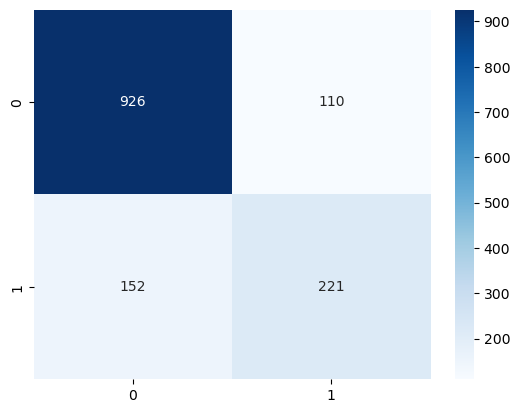

In [199]:
cm = confusion_matrix(y_test, y_lr_pred)

TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('True Negative', TN)
print('True Positive', TP)
print('False Negative', FN)
print('False Positive', FP)

# visualize the confusion matrix 
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [200]:
#get the accuracy using the formula
m_accuracy = (TN + TP)/ (TN + TP + FP + FN)

## print the model accuracy
print('Model Accuracy', m_accuracy)

Model Accuracy 0.8140525195173882


The above shows that this model is not able to predict churned customers accurately with the precision value of 81%. The confusion matrix also has high False Negative and False Positive values. This is largely due to the imbalanced dataset. 

### Using RandomForestClassifier

In [168]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

RandomForestClassifier()

In [169]:
y_rf_pred = rf.predict(x_test)

In [170]:
print(classification_report(y_test, y_rf_pred,labels=[0,1]))

              precision    recall  f1-score   support

           0       0.82      0.92      0.87      1036
           1       0.67      0.45      0.54       373

    accuracy                           0.79      1409
   macro avg       0.74      0.69      0.70      1409
weighted avg       0.78      0.79      0.78      1409



In [154]:
# confusion matrix

In [155]:
cm = confusion_matrix(y_test, y_rf_pred)

TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('True Negative', TN)
print('True Positive', TP)
print('False Negative', FN)
print('False Positive', FP)

[[947  89]
 [197 176]]
True Negative 947
True Positive 176
False Negative 197
False Positive 89


Prediction rate still low

### GradientBoostingClassifier

In [171]:
gb = GradientBoostingClassifier()
gb.fit(x_train, y_train)


GradientBoostingClassifier()

In [172]:
y_gb_pred = gb.predict(x_test)

In [159]:
print(classification_report(y_test, y_gb_pred,labels=[0,1]))

print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_gb_pred)
TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('True Negative', TN)
print('True Positive', TP)
print('False Negative', FN)
print('False Positive', FP)

y_gb_model_acc = (TN+TP)/(TN+TP+FN+FP) * 100
print('Confusion matrix accuracy for GradientBoost Classifier Model', y_gb_model_acc)

              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1036
           1       0.70      0.52      0.60       373

    accuracy                           0.81      1409
   macro avg       0.77      0.72      0.74      1409
weighted avg       0.80      0.81      0.80      1409

Confusion Matrix:
[[951  85]
 [178 195]]
True Negative 951
True Positive 195
False Negative 178
False Positive 85
Confusion matrix accuracy for GradientBoost Classifier Model 81.33427963094393


### XGBOOST CLASSIFIER

In [173]:
import xgboost as xgb
from xgboost import XGBClassifier

In [186]:
xgb = XGBClassifier()
xgb.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [187]:
xgb_pred = xgb.predict(x_test)

In [188]:
print("Classification Report:")
print(classification_report(y_test, xgb_pred))

print("Confusion Matrix:")
cm = confusion_matrix(y_test, xgb_pred)
TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('True Negative', TN)
print('True Positive', TP)
print('False Negative', FN)
print('False Positive', FP)

xgb_model_acc = (TN+TP)/(TN+TP+FN+FP) * 100
print('Confusion matrix accuracy for XGBoost Classifier Model', xgb_model_acc)


Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.90      0.87      1036
           1       0.64      0.50      0.57       373

    accuracy                           0.79      1409
   macro avg       0.74      0.70      0.72      1409
weighted avg       0.78      0.79      0.79      1409

Confusion Matrix:
[[932 104]
 [185 188]]
True Negative 932
True Positive 188
False Negative 185
False Positive 104
Confusion matrix accuracy for XGBoost Classifier Model 79.4889992902768


### XGBoost Model

In [179]:
r_xgb = XGBClassifier()
r_xgb.fit(xr_train, yr_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [180]:
yxgb_pred = r_xgb.predict(xr_test)

In [157]:
print("Classification Report:")
print(classification_report(yr_test, yxgb_pred))

print("Confusion Matrix:")
cm = confusion_matrix(yr_test, yxgb_pred)
TN = cm[0][0]
TP = cm[1][1]
FN = cm[1][0]
FP = cm[0][1]

print(cm)
print('True Negative', TN)
print('True Positive', TP)
print('False Negative', FN)
print('False Positive', FP)

xgb_model_acc = (TN+TP)/(TN+TP+FN+FP) * 100
print('Confusion matrix accuracy for XGBoost Classifier Model', xgb_model_acc)

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       566
           1       0.97      0.98      0.97       704

    accuracy                           0.97      1270
   macro avg       0.97      0.97      0.97      1270
weighted avg       0.97      0.97      0.97      1270

Confusion Matrix:
[[545  21]
 [ 16 688]]
True Negative 545
True Positive 688
False Negative 16
False Positive 21
Confusion matrix accuracy for XGBoost Classifier Model 97.08661417322834


In [164]:
final_result = pd.DataFrame(d_model)

Factors contributing to churn rate:
High Monthly charges
Low Technical Support

#### Recommendations to ConnectTel Ltd


#### 1.  Improve on its Technical Support to render real time processing of complaints 
#### 2. Work on Pricing rate that attract and retain customers
